## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---


In [1]:
## Import all necessary libraries
import numpy as np
import cv2
import glob
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
#import skimage 

## Compute the camera calibration matrix and distortion coefficients 

* using chessboard images in **camera_cal** folder.

In [2]:
%%HTML
<style> code {background-color : pink !important;} </style>

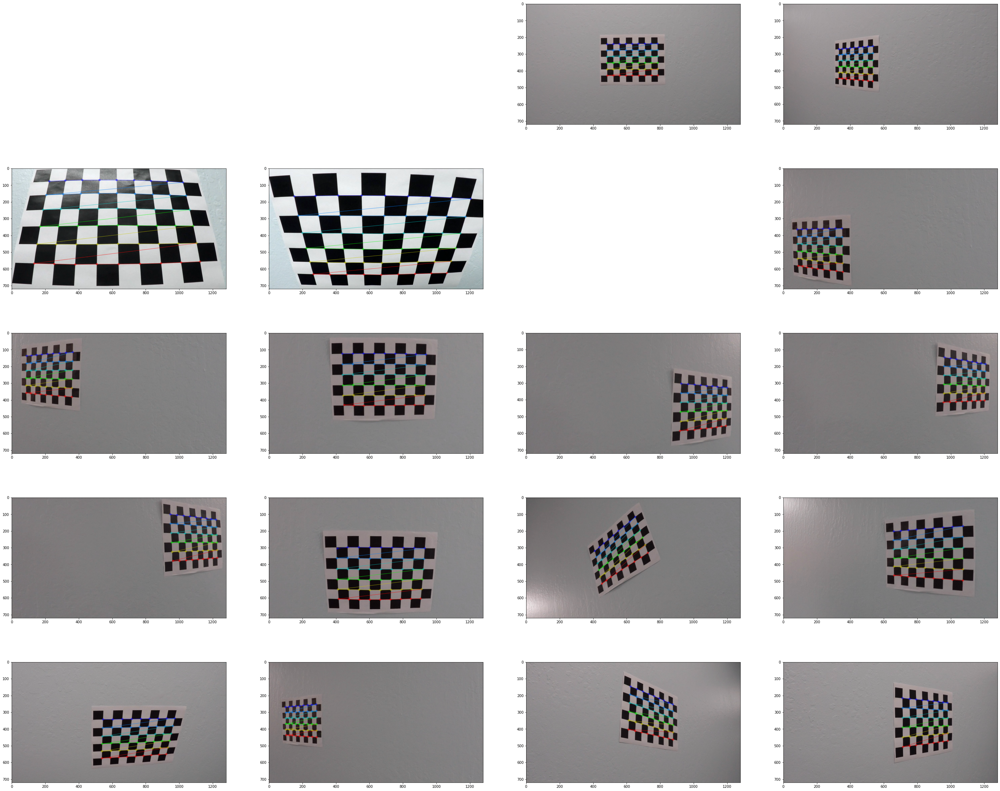

In [3]:
# Chessboard Size: 9 x 6 corners
# %matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
columns = 4  # no. of images to be printed in each column
plt.rcParams["figure.figsize"] = (50,50)
plt.tight_layout()
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.subplot(len(images) / columns + 1, columns, i + 1)
        plt.imshow(img)

### If the above cell ran sucessfully, we should now have `objpoints` and `imgpoints` needed for camera calibration.  

Use the **cal_undistort** function below to undsitort any image for the camera. 

In [4]:
def cal_undistort(img, objpoints, imgpoints):
    # The function takes an image, object points, and image points
    # performs the camera calibration, image distortion correction and returns the undistorted image
    
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist

### Test distortion correction coefficients on a raw image

Make sure you use the correct grayscale conversion depending on how you've read in your images. 
* Use cv2.COLOR_RGB2GRAY if you've read in an image using mpimg.imread(). 
* Use cv2.COLOR_BGR2GRAY if you've read in an image using cv2.imread().


Text(0.5, 1.0, 'Undistorted Image')

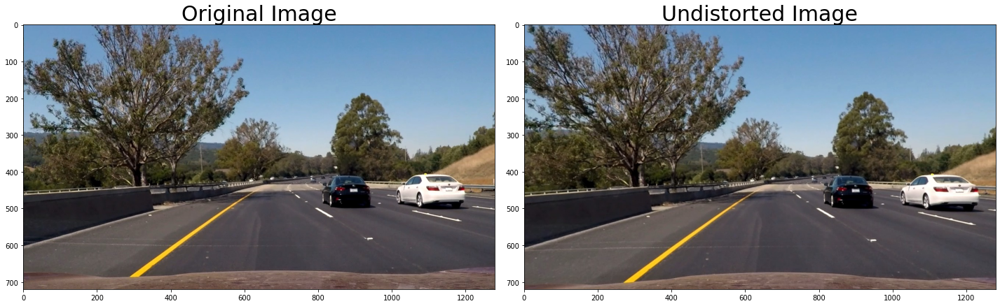

In [5]:
%matplotlib inline

# Test undistortion on an image
#img = cv2.imread('camera_cal/calibration1.jpg')
#img = cv2.imread('test_images/signs_vehicles_xygrad.png')
#img = mpimg.imread('camera_cal/calibration5.jpg')
#img = mpimg.imread('test_images/signs_vehicles_xygrad.jpg')
#img = mpimg.imread('test_images/straight_lines2.jpg')
img = mpimg.imread('test_images/test6.jpg')


img_size = (img.shape[1], img.shape[0])
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
undist = cv2.undistort(img, mtx, dist, None, mtx)
#undist = cal_undistort(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)

## Perspective transform 

In [6]:
def corners_unwarp(img, src, dst):
    undistorted = np.copy(img)
    img_size = (undistorted.shape[1],undistorted.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undistorted, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M

Text(0.5, 1.0, 'Perspective transformed image')

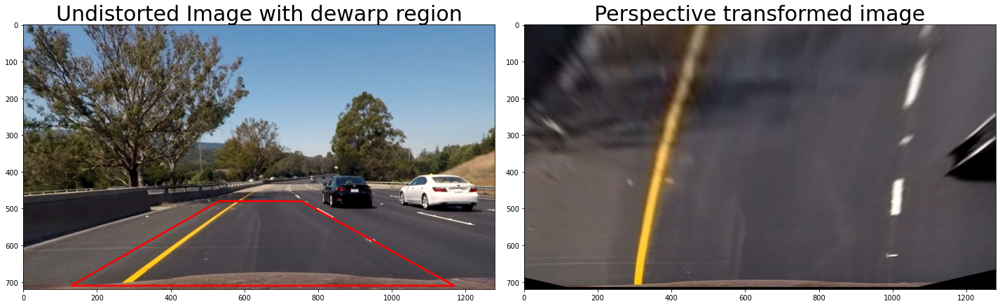

In [7]:
# Define ROI for Perspective transform in the undistorted image

sl_bot = [130,710]
sl_top = [531,480]
sr_bot = [1170,710]
sr_top = [755,480]

dl_bot = [200,710]
dl_top = [200,300]
dr_bot = [1000,710]
dr_top = [1000,300]

src = np.array([sl_bot,sl_top,sr_top,sr_bot], np.int32)
src = src.reshape((-1,1,2))
undist_poly = cv2.polylines(undist.copy(),[src],True,(255,0,0), thickness=3)

src = np.float32([sl_bot,sl_top,sr_bot,sr_top])
dst = np.float32([dl_bot,dl_top,dr_bot,dr_top])      

top_down, perspective_M = corners_unwarp(undist, src, dst) 
#plt.rcParams["figure.figsize"] = (50,50)
#plt.imshow(undist_poly)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.tight_layout()
ax1.imshow(undist_poly)
ax1.set_title('Undistorted Image with dewarp region', fontsize=30)
ax2.imshow(top_down)
ax2.set_title('Perspective transformed image', fontsize=30)

## Combine gradients & S Color thresholds to create a thresholded binary image.

### Combine all gradients 

In [8]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, sob_thresh=(0, 255)):    
    # Calculate directional gradient
    # Apply threshold

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    grad_binary[(scaled_sobel >= sob_thresh[0]) & (scaled_sobel <= sob_thresh[1])] = 1

    # Return the result
    return grad_binary

def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    # Apply threshold
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return mag_binary

def dir_threshold(img, sobel_kernel=3, dir_thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # Apply threshold
    
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= dir_thresh[0]) & (absgraddir <= dir_thresh[1])] = 1

    # Return the binary image
    return dir_binary

**Tune and test gradient thresholds on a sample image**

Text(0.5, 1.0, 'Direction Gradient')

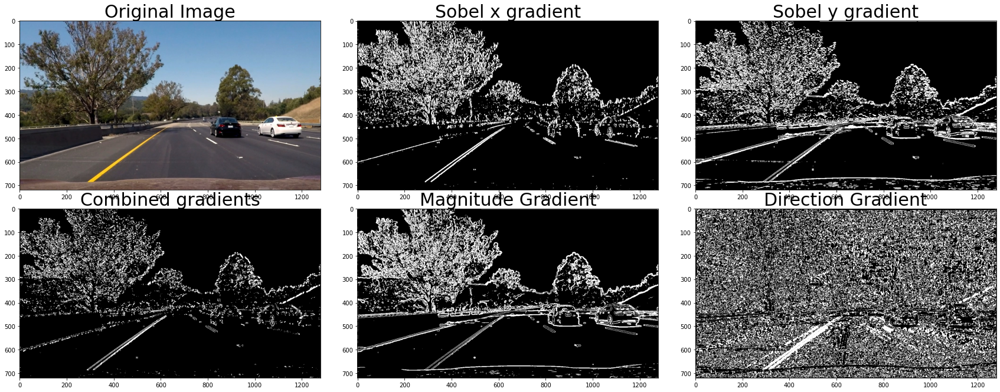

In [9]:
# Read in an image and grayscale it
#image = mpimg.imread('test_images/test4.jpg')
image = img.copy()
#img = cv2.imread('test_images/signs_vehicles_xygrad.png')
# Choose a Sobel kernel size
ksize = 9 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, sob_thresh=(20, 100))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, sob_thresh=(20, 100))
mag_binary = mag_threshold(image, sobel_kernel=9, mag_thresh=(30, 100))
dir_binary = dir_threshold(image, sobel_kernel=15, dir_thresh=(0.7, 1.3))

combined_grad = np.zeros_like(dir_binary)
#combined = np.zeros((dir_binary.shape[0], dir_binary.shape[1], 3), dtype=np.uint8)
combined_grad[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1


f, [(ax1, ax2, ax3), (ax4, ax5, ax6)] = plt.subplots(2, 3, figsize=(24,9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax4.imshow(combined_grad, cmap='gray')
ax4.set_title('Combined gradients', fontsize=30)

ax2.imshow(gradx, cmap='gray')
ax2.set_title('Sobel x gradient', fontsize=30)
ax3.imshow(grady, cmap='gray')
ax3.set_title('Sobel y gradient', fontsize=30)

ax5.imshow(mag_binary, cmap='gray')
ax5.set_title('Magnitude Gradient', fontsize=30)
ax6.imshow(dir_binary, cmap='gray')
ax6.set_title('Direction Gradient', fontsize=30)

## Define HLS & Color thresholds

In [10]:
def hls_select(img, thresh=(0, 255)):
    # Define a function that thresholds the S-channel of HLS
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    # print (s_channel)
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    # plt.imshow(s_binary, cmap='gray')
    return s_binary

### Test & tune HLS thresholds

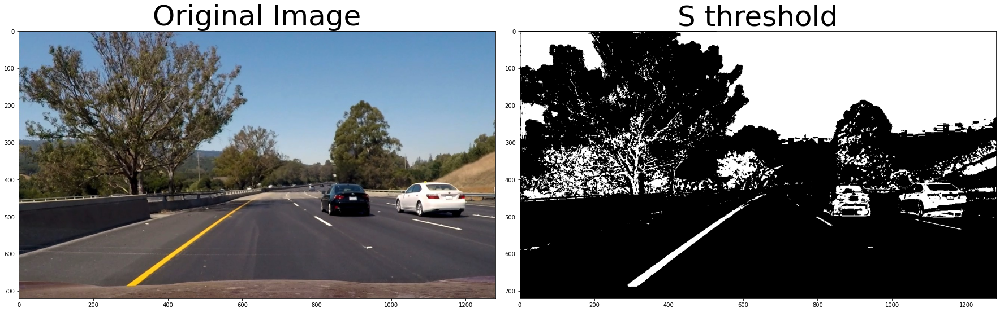

In [11]:
# Read in an image
#image = mpimg.imread('test_images/test5.jpg')

# Generate s color binary image
s_binary = hls_select(image, thresh=(90, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(s_binary, cmap='gray')
ax2.set_title('S threshold', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


### Combine color & gradient thresholds

In [12]:
def combine_col_grad(img, s_thresh=(0, 255), sob_thresh = (0,255), mag_thresh=(0,255), dir_thresh=(0, np.pi/2)):
    # Read in an image
    #image = mpimg.imread('test_images/test4.jpg')

    # Apply thresholding functions on Gradients and combine them
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, sob_thresh=(sob_thresh[0], sob_thresh[1]))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=3, sob_thresh=(sob_thresh[0], sob_thresh[1]))
    mag_binary = mag_threshold(image, sobel_kernel=9, mag_thresh=(mag_thresh[0], mag_thresh[1]))
    dir_binary = dir_threshold(image, sobel_kernel=15, dir_thresh=(dir_thresh[0], dir_thresh[1]))

    combined_grad = np.zeros_like(dir_binary)
    #combined = np.zeros((dir_binary.shape[0], dir_binary.shape[1], 3), dtype=np.uint8)
    combined_grad[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

    # Apply threshold on s-color channel
    s_binary = hls_select(image, thresh=(90, 255))
    
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    # color_binary = np.dstack(( np.zeros_like(combined_grad), combined_grad, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(s_binary == 1) | (combined_grad == 1)] = 1
  
    return combined_binary

### Test s-color threshold & gradient threshold

Text(0.5, 1.0, 'Combined S channel and gradient thresholds')

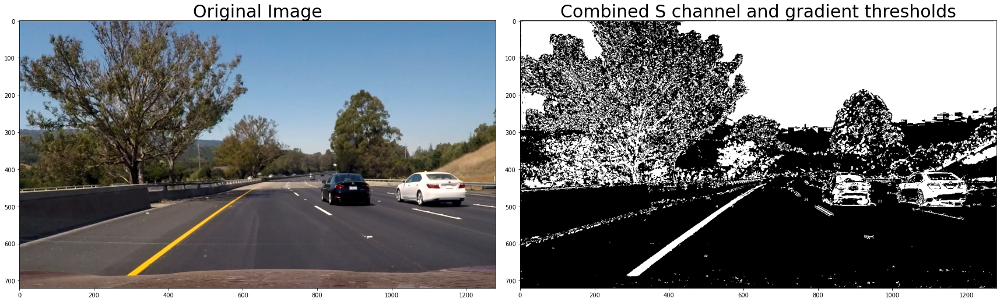

In [13]:
colors_gradients = combine_col_grad(image, s_thresh=(0, 255), sob_thresh = (20,100), mag_thresh=(30,100), dir_thresh=(0.7, 1.3))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(colors_gradients, cmap = 'gray')
ax2.set_title('Combined S channel and gradient thresholds', fontsize=30)

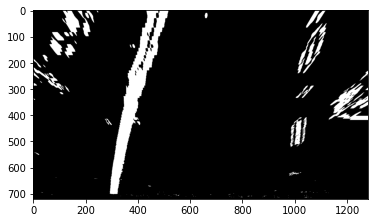

In [14]:
img_size = (colors_gradients.shape[1],colors_gradients.shape[0])
thres_transformed = cv2.warpPerspective(colors_gradients.copy(), perspective_M, img_size, flags=cv2.INTER_LINEAR)
plt.imshow(thres_transformed, cmap='gray')


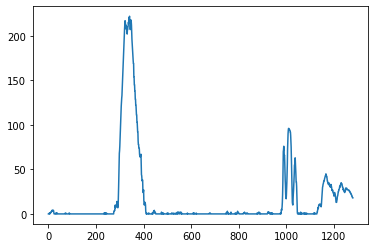

In [15]:
histogram = np.sum(thres_transformed[thres_transformed.shape[0]//2:,:], axis=0)
plt.plot(histogram)